# Setup

Mounting to google drive and installing all the necessary dependencies like musescore

In [1]:
# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

In [2]:
# !yes | add-apt-repository ppa:mscore-ubuntu/mscore3-stable
# !apt update
# !apt install musescore3
# print("MuseScore installation finished")

In [3]:
# !pip uninstall music21 -y
# !pip install music21

In [4]:
import pandas as pd
import numpy as np
from music21 import converter, corpus
from music21 import *

In [5]:
# !ls '/content/drive/MyDrive/Thesis'
# DATA_DIR = '/content/drive/MyDrive/Thesis'

# Gestalt Based Segmentation (WIP)

Gestalt segmentation based on Tenney and Polansky 1980 and derived from the Matlab MIDI Toolbox library. (Need to fix / confirm actually works correctly)

In [6]:
def midi_to_nmat(midi_file):
  s = converter.parse(midi_file)
  nmat = pd.DataFrame(columns=['onset_beats', 'duration_beats', 'midi_pitch', 'onset_sec', 'duration_sec', 'is_note', 'is_chord', 'major', 'minor', 'has_seventh'])
  onset = 0
  for el in s.flatten().notes:
    if isinstance(el, chord.Chord):
      row = [el.offset, el.duration.quarterLength, el.root().midi, onset, el.seconds, 0, 1, (el.isMajorTriad()*1), (el.isMinorTriad()*1), (el.seventh is None)]
    else:
      row = [el.offset, el.duration.quarterLength, el.pitch.midi, onset, el.seconds, 1, 0, 0, 0, 0]
    nmat.loc[len(nmat)] = row
    onset += el.seconds
  return nmat

In [7]:
# midi = DATA_DIR + "/bach_846.mid"
midi = '..\\Music Database\\bach_846.mid'
nmat = midi_to_nmat(midi)
nmat.head(10)

,onset_beats,duration_beats,midi_pitch,onset_sec,duration_sec,is_note,is_chord,major,minor,has_seventh
0,0.0,2.0,60.0,0.000000,1.621622,1.0,0.0,0.0,0.0,0.0
1,0.25,1.75,64.0,1.621622,1.418919,1.0,0.0,0.0,0.0,0.0
2,0.5,0.25,67.0,3.040541,0.202703,1.0,0.0,0.0,0.0,0.0
3,0.75,0.25,72.0,3.243243,0.202703,1.0,0.0,0.0,0.0,0.0
4,1.0,0.25,76.0,3.445946,0.198675,1.0,0.0,0.0,0.0,0.0
5,1.25,0.25,67.0,3.644621,0.202703,1.0,0.0,0.0,0.0,0.0
6,1.5,0.25,72.0,3.847324,0.202703,1.0,0.0,0.0,0.0,0.0
7,1.75,0.25,76.0,4.050027,0.202703,1.0,0.0,0.0,0.0,0.0
8,2.0,2.0,60.0,4.252730,1.621622,1.0,0.0,0.0,0.0,0.0
9,2.25,1.75,64.0,5.874351,1.418919,1.0,0.0,0.0,0.0,0.0


In [94]:
def get_onset(notematrix: pd.DataFrame, timetype='beat'):
  if timetype == 'beat':
    return notematrix['onset_beats']
  elif timetype == 'sec':
    return notematrix['onset_sec']
  else:
    ValueError(f"Invalid timetype: {timetype}. Choices are only 'beat' and 'sec'")

In [95]:
def get_duration(notematrix: pd.DataFrame, timetype='beat') -> pd.Series:
  if timetype == 'beat':
    return notematrix['duration_beats']
  elif timetype == 'sec':
    return notematrix['duration_sec']
  else:
    ValueError(f"Invalid timetype: {timetype}. Choices are only 'beat' and 'sec'")

In [96]:
def calculate_clang_boundaries(notematrix: pd.DataFrame):
  cl = 2*(get_onset(notematrix).diff() + get_duration(notematrix).shift(-1)) + abs(notematrix['midi_pitch'].diff())
  clb = (cl.shift(-1) > cl) & (cl.shift(1) > cl)
  clind = clb.index[clb].tolist()
  return clind

In [97]:
clang_boundaries = calculate_clang_boundaries(nmat)
print("Clang Boundaries:", clang_boundaries)

Clang Boundaries: [2, 4, 6, 10, 12, 14, 17, 20, 22, 25, 28, 30, 33, 36, 39, 41, 44, 47, 50, 52, 54, 58, 60, 62, 65, 68, 70, 73, 76, 78, 81, 83, 86, 89, 91, 94, 97, 100, 102, 105, 108, 110, 113, 115, 118, 121, 123, 126, 129, 131, 134, 137, 139, 142, 147, 150, 155, 158, 162, 164, 166, 170, 172, 174, 177, 179, 182, 185, 187, 190, 193, 196, 198, 201, 204, 206, 209, 211, 214, 217, 219, 222, 225, 228, 230, 233, 236, 238, 241, 243, 246, 249, 251, 254, 257, 259, 262, 265, 267, 270, 275, 278, 283, 286, 290, 292, 294, 298, 300, 302, 307, 310, 315, 318, 323, 326, 331, 334, 337, 342, 345, 350, 355, 358, 363, 366, 370, 372, 374, 378, 380, 382, 386, 388, 390, 394, 396, 398, 406, 414, 419, 422, 427, 430, 435, 438, 443, 446, 450, 454, 458, 462, 470, 478, 483, 486, 491, 494, 499, 502, 507, 510, 515, 527, 540, 545, 547, 556, 563, 566, 572, 575, 578, 580, 583, 585, 590, 592, 594, 596, 598, 600, 609, 611, 616, 619, 621, 623, 628, 633, 636, 638, 640, 645, 647, 652, 654, 656, 658, 667, 669, 674, 677, 680, 6

In [98]:
def calculate_segment_boundaries(notematrix, clind):
    first = [0] + clind
    last = clind + [len(notematrix) - 1]
    mean_pitch = [notematrix.iloc[first[i]:last[i]+1]['midi_pitch'].mean() for i in range(len(first))]
    segdist = []
    for i in range(1, len(first)):
        segdist.append(abs(mean_pitch[i] - mean_pitch[i - 1]) +
                       notematrix.iloc[first[i]]['onset_sec'] - notematrix.iloc[last[i - 1]]['onset_sec'] +
                       notematrix.iloc[first[i]]['duration_sec'] + notematrix.iloc[first[i - 1]]['duration_sec'] +
                       2 * (notematrix.iloc[first[i]]['onset_sec'] - notematrix.iloc[last[i - 1]]['onset_sec']))

    segb = [(segdist[i] > segdist[i-1] and segdist[i] > segdist[i+1]) for i in range(1, len(segdist)-1)]
    segind = [clind[i] for i in range(1, len(segdist)-1) if segb[i-1]]
    return segind

In [99]:
def segmentgestalt(notematrix):
    if notematrix.empty:
        return None

    clind = calculate_clang_boundaries(notematrix)
    segind = calculate_segment_boundaries(notematrix, clind)

    segments = []
    start_idx = 0
    for end_idx in segind:
        segments.append(notematrix.iloc[start_idx:end_idx+1])
        start_idx = end_idx + 1

    segments.append(notematrix.iloc[start_idx:])
    return segments

In [100]:
segments = segmentgestalt(nmat)
for idx, segment in enumerate(segments):
    print(f"Segment {idx+1}:")
    print(segment)
    print("----------------------")

Segment 1:
   onset_beats duration_beats  midi_pitch  onset_sec  duration_sec  is_note  \
0          0.0            2.0        60.0   0.000000      1.621622      1.0   
1         0.25           1.75        64.0   1.621622      1.418919      1.0   
2          0.5           0.25        67.0   3.040541      0.202703      1.0   
3         0.75           0.25        72.0   3.243243      0.202703      1.0   
4          1.0           0.25        76.0   3.445946      0.198675      1.0   
5         1.25           0.25        67.0   3.644621      0.202703      1.0   
6          1.5           0.25        72.0   3.847324      0.202703      1.0   
7         1.75           0.25        76.0   4.050027      0.202703      1.0   
8          2.0            2.0        60.0   4.252730      1.621622      1.0   
9         2.25           1.75        64.0   5.874351      1.418919      1.0   
10         2.5           0.25        67.0   7.293270      0.202703      1.0   

    is_chord  major  minor  has_seventh 

In [101]:
type(segments)

list

# DTW Distance Using TSLearn

In [102]:
# !pip install tslearn

In [103]:
import numpy as np
from tslearn.metrics import dtw
from multiprocessing import Pool, Manager, cpu_count
import worker

In [104]:
def segments_to_distance_matrix(segments: list[pd.DataFrame], cores=None):
    if __name__ == '__main__':
        
        if cores is not None and cores > cpu_count():
            raise ValueError(f"You don't have enough cores! Please specify a value within your system's number of cores. \n Core Count: {cpu_count()}")
        
        seg_np = [segment.to_numpy() for segment in segments]
    
        num_segments = len(seg_np)
        distance_matrix = np.zeros((num_segments, num_segments))
    
        # Create argument list for multiprocessing
        args_list = []
        for i in range(num_segments):
            for j in range(i + 1, num_segments):
                args_list.append((i, j, segments[i], segments[j]))
    
        with Manager() as manager:
            message_list = manager.list()
    
            def log_message(message):
                message_list.append(message)
    
            # Use multiprocessing Pool to parallelize the calculations
            with Pool() as pool:
                results = pool.map(worker.calculate_distance, args_list)
    
            # Update distance matrix with the results
            for i, j, distance, message in results:
                distance_matrix[i, j] = distance
                distance_matrix[j, i] = distance  # Reflect along the diagonal
                log_message(message)
    
            # Print messages from the shared list
            for message in message_list:
                print(message)
    
        return distance_matrix

In [105]:
dist_mat = segments_to_distance_matrix(segments)

Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

# Building the KNN Graph


In [106]:
from sklearn.neighbors import kneighbors_graph
import networkx as nx
from networkx.algorithms.cuts import conductance
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances

The KNN graph is disjoint. Ensuring connectivity...


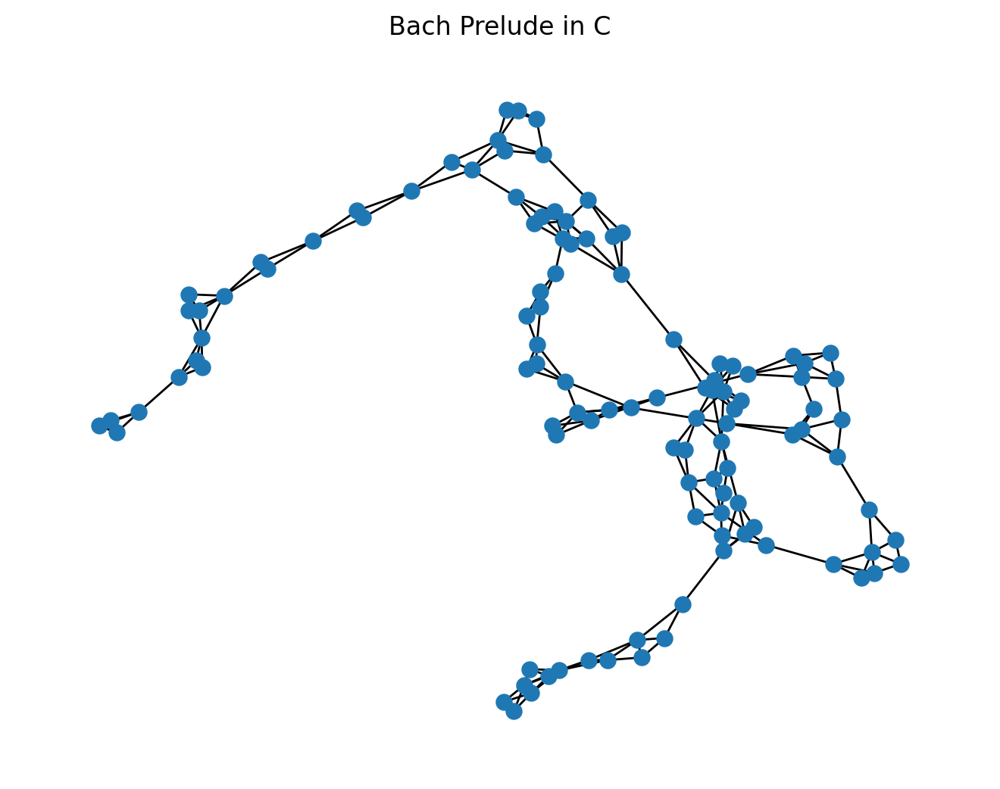

In [107]:
k = 3
distance_matrix = dist_mat
knn_graph = kneighbors_graph(distance_matrix, n_neighbors=k, mode='connectivity')

G = nx.from_scipy_sparse_array(knn_graph)

# Detect if the graph is disjoint
if not nx.is_connected(G):
    print("The KNN graph is disjoint. Ensuring connectivity...")

    # Calculate the connected components
    components = list(nx.connected_components(G))

    # Connect the components
    for i in range(len(components) - 1):
        min_dist = np.inf
        closest_pair = None
        for node1 in components[i]:
            for node2 in components[i + 1]:
                dist = distance_matrix[node1, node2]
                if dist < min_dist:
                    min_dist = dist
                    closest_pair = (node1, node2)

        # Add an edge between the closest pair of nodes from different components
        G.add_edge(closest_pair[0], closest_pair[1])

# Plot the final connected graph
pos = nx.spring_layout(G, seed=42, iterations=50)
pos_dict = {i: pos[i] for i in range(len(pos))}
nx.draw(G, node_size=50, pos=pos_dict)
plt.title('Bach Prelude in C')
plt.show()

In [108]:
def distance_matrix_to_knn_graph(k: int, distance_matrix: np.array, graph_title: str,
                                 seed: int, iterations: int):
  knn_graph = kneighbors_graph(distance_matrix, n_neighbors=k, mode='connectivity')

  G = nx.from_scipy_sparse_array(knn_graph)

  # Detect if the graph is disjoint
  if not nx.is_connected(G):
      print("The KNN graph is disjoint. Ensuring connectivity...")

      # Calculate the connected components
      components = list(nx.connected_components(G))

      # Connect the components
      for i in range(len(components) - 1):
          min_dist = np.inf
          closest_pair = None
          for node1 in components[i]:
              for node2 in components[i + 1]:
                  dist = distance_matrix[node1, node2]
                  if dist < min_dist:
                      min_dist = dist
                      closest_pair = (node1, node2)

          # Add an edge between the closest pair of nodes from different components
          G.add_edge(closest_pair[0], closest_pair[1])

  # Plot the final connected graph
  pos = nx.spring_layout(G, seed=seed, iterations=iterations)
  nx.draw(G, node_size=50, pos=pos)
  plt.title(graph_title + f" (K={k})")
  plt.show()

The KNN graph is disjoint. Ensuring connectivity...


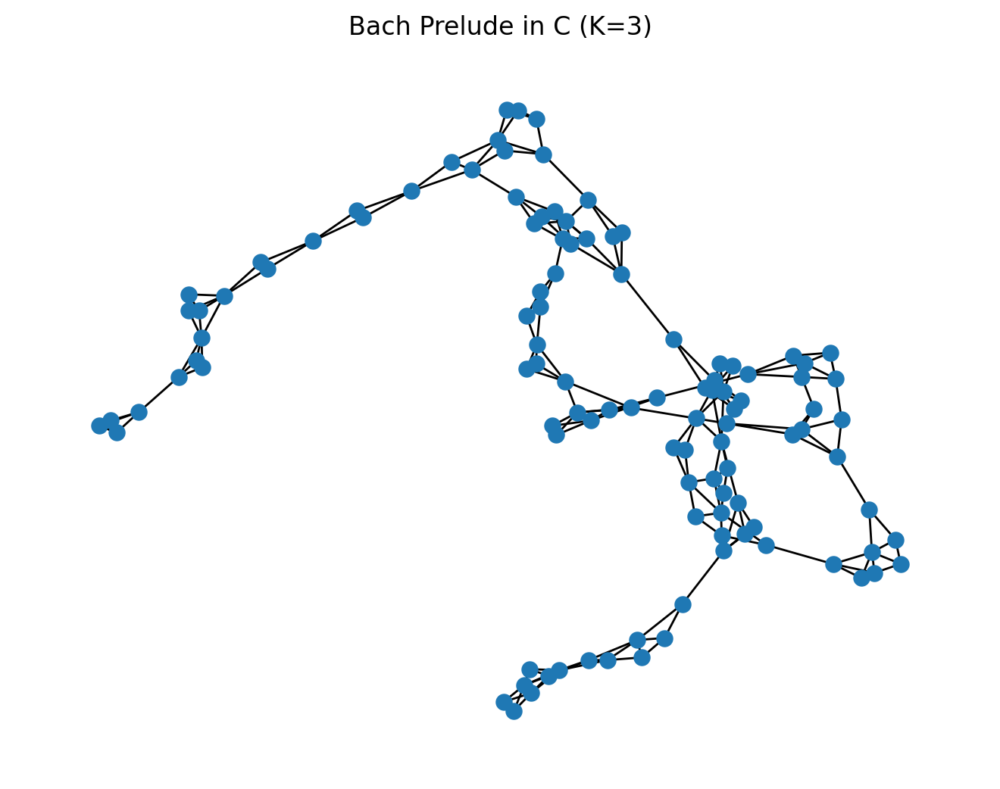

In [109]:
distance_matrix_to_knn_graph(3, dist_mat, "Bach Prelude in C", 42, 50)

## Currently Trying to Put The Segment Data Into The Node so we can analyze grouped segments

In [110]:
def segments_to_graph(k: int, segments: list[pd.DataFrame], cores=None):
  # Convert segments to a distance matrix
  distance_matrix = segments_to_distance_matrix(segments, cores=cores)

  # Compute the k-NN graph
  knn_graph = kneighbors_graph(distance_matrix, n_neighbors=k, mode='connectivity')

  # Convert the k-NN graph to a NetworkX graph
  G = nx.from_scipy_sparse_array(knn_graph)

  # Add segment data as attributes to each node
  for i in range(len(segments)):
    G.nodes[i]['segment'] = segments[i]

  # Detect if the graph is disjoint
  if not nx.is_connected(G):
      print("The KNN graph is disjoint. Ensuring connectivity...")

      # Calculate the connected components
      components = list(nx.connected_components(G))

      # Connect the components
      for i in range(len(components) - 1):
          min_dist = np.inf
          closest_pair = None
          for node1 in components[i]:
              for node2 in components[i + 1]:
                  dist = distance_matrix[node1, node2]
                  if dist < min_dist:
                      min_dist = dist
                      closest_pair = (node1, node2)

          # Add an edge between the closest pair of nodes from different components
          G.add_edge(closest_pair[0], closest_pair[1])

  return G, distance_matrix

In [111]:
graph, distance_matrix = segments_to_graph(5, segments)

Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

## Trying to find ways to validate "Graph Identity"

besides average dtw distance Im trying to see if I can make something of a graph "silhouette score".

Basically get the communities in the graph then calculate the following:

* homogeneity: intra-cluster distance

* heterogeneity: inter-cluster distance

* "Graph Silhoette Score:" $\frac{Heterogeneity - Homogeneity} {max(Hetero, Homo)}$

Also might take a look at clustering coefficients

In [112]:
def graph_metrics(graph: nx.classes.graph.Graph, distance_matrix: np.array,
                  seed: int):
  avg_dtw_distance = distance_matrix.mean()
  avg_clustering_coef = nx.average_clustering(graph)

  communities = nx.community.louvain_communities(graph, seed)

  silhouette_scores = []
  for cluster in communities:
    for i in cluster:
      cluster_distances = distance_matrix[i, list(cluster - {i})]
      homogeneity = np.mean(cluster_distances)
      other_cluster_distances = [np.mean(distance_matrix[i, list(other_cluster)]) for other_cluster in communities if other_cluster != cluster]
      heterogeneity = min(other_cluster_distances) if other_cluster_distances else homogeneity
      silhouette_score = (heterogeneity - homogeneity) / max(heterogeneity, homogeneity)
      silhouette_scores.append(silhouette_score)

  # Average silhouette score for all nodes
  average_silhouette_score = np.mean(silhouette_scores)

  conductance_scores = []
  for cluster in communities:
    cluster_conductance = conductance(graph, cluster)
    conductance_scores.append(cluster_conductance)

  average_conductance = np.mean(conductance_scores)

  print("Average DTW Distance:", avg_dtw_distance)
  print("Average Clustering Coefficient:", avg_clustering_coef)
  print("Average Silhouette Score", average_silhouette_score)
  print("Average Conductance:", average_conductance)

In [113]:
graph_metrics(graph, distance_matrix, 42)

Average DTW Distance: 864.8719809815823
Average Clustering Coefficient: 0.5807411780139052
Average Silhouette Score 0.2523297124200482
Average Conductance: 0.11698073863260387


In [114]:
len(graph)

110

In [115]:
for node in graph.nodes(data=True):
  node_id = node[0]
  segment_data = node[1]['segment']
  print(f"Node {node_id} segment data:")
  print(segment_data)

Node 0 segment data:
   onset_beats duration_beats  midi_pitch  onset_sec  duration_sec  is_note  \
0          0.0            2.0        60.0   0.000000      1.621622      1.0   
1         0.25           1.75        64.0   1.621622      1.418919      1.0   
2          0.5           0.25        67.0   3.040541      0.202703      1.0   
3         0.75           0.25        72.0   3.243243      0.202703      1.0   
4          1.0           0.25        76.0   3.445946      0.198675      1.0   
5         1.25           0.25        67.0   3.644621      0.202703      1.0   
6          1.5           0.25        72.0   3.847324      0.202703      1.0   
7         1.75           0.25        76.0   4.050027      0.202703      1.0   
8          2.0            2.0        60.0   4.252730      1.621622      1.0   
9         2.25           1.75        64.0   5.874351      1.418919      1.0   
10         2.5           0.25        67.0   7.293270      0.202703      1.0   

    is_chord  major  minor  ha

In [116]:
def plot_graph(graph: nx.classes.graph.Graph,
               seed: int,
               iterations: int,
               title: str,
               node_size: int):
  pos = nx.spring_layout(graph, seed=seed, iterations=iterations)
  nx.draw(G, node_size=node_size, pos=pos)
  plt.title(title)
  plt.show()

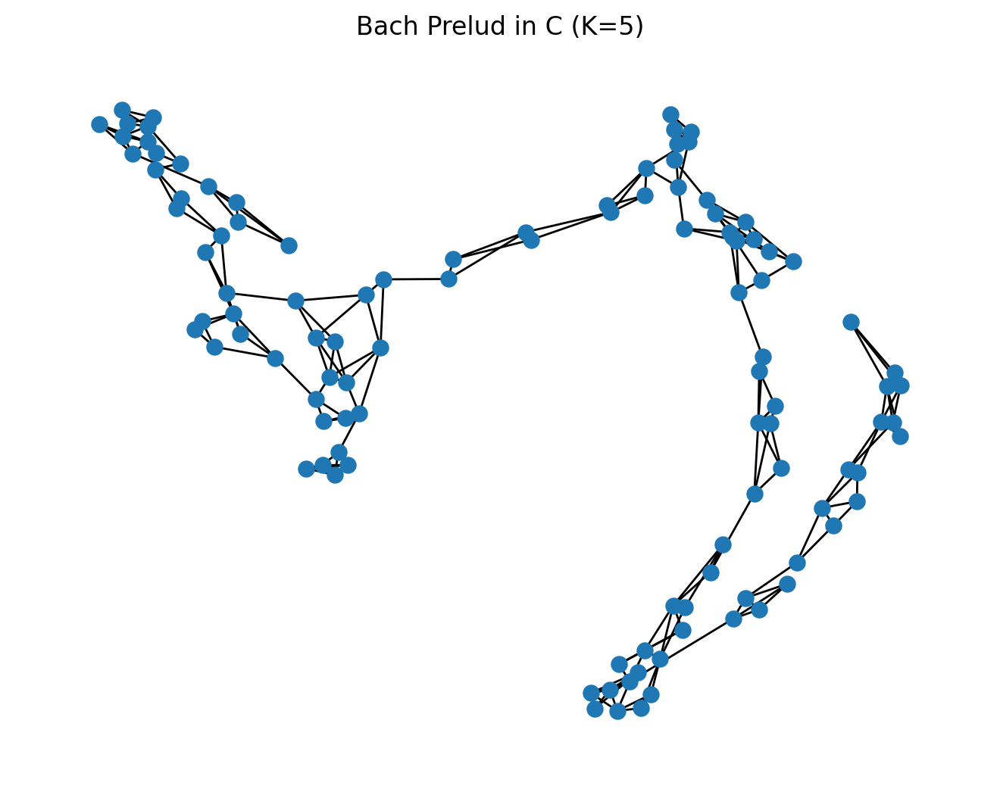

In [117]:
plot_graph(graph, 3, 50, "Bach Prelud in C (K=5)", 50)

In [118]:
# !pip install pyvis

In [119]:
from pyvis.network import Network

In [120]:
for i in range(len(graph.nodes())):
  graph.nodes[i]['segment'] = graph.nodes[i]['segment'].to_json(default_handler=str)

In [121]:
nt = Network('1000px', '1000px', notebook=True, cdn_resources = 'remote')
nt.from_nx(graph)
# nt.save_graph(DATA_DIR + '/sample_graph.html')

In [122]:
from IPython.core.display import display, HTML

C:\Users\RJ Conanan\AppData\Local\Temp\ipykernel_20904\3492823427.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


# Still need to figure out the labels

In [123]:
nt.show('sample_graph.html')
display(HTML('sample_graph.html'))

sample_graph.html


# Build a Bigger Graph

Trying to use multiple songs for the graph now

In [124]:
# DATA_DIR

In [125]:
# !ls '/content/drive/MyDrive/Thesis/Chopin'
CHOPIN_DIR = 'Chopin'

In [50]:
chopin = ['Ballade.mid', 'Fantasie-Impromptu.mid', 'Raindrop-Prelude.mid']
chopin_segments = []
for piece in chopin:
  directory = CHOPIN_DIR + '/' + piece
  notematrix = midi_to_nmat(directory)
  segments = segmentgestalt(notematrix)
  chopin_segments.extend(segments)

chopin_segments

[  onset_beats duration_beats  midi_pitch  onset_sec  duration_sec  is_note  \
 0         0.0            2.5        48.0   0.000000      2.172968      1.0   
 1         0.0            2.5        36.0   2.172968      2.172968      1.0   
 2         2.5            0.5        51.0   4.345937      0.407941      1.0   
 3         2.5            0.5        39.0   4.753878      0.407941      1.0   
 4         3.0            0.5        56.0   5.161819      0.389610      1.0   
 5         3.0            0.5        44.0   5.551429      0.389610      1.0   
 6         3.5            0.5        58.0   5.941040      0.405405      1.0   
 7         3.5            0.5        46.0   6.346445      0.405405      1.0   
 
    is_chord  major  minor  has_seventh  
 0       0.0    0.0    0.0          0.0  
 1       0.0    0.0    0.0          0.0  
 2       0.0    0.0    0.0          0.0  
 3       0.0    0.0    0.0          0.0  
 4       0.0    0.0    0.0          0.0  
 5       0.0    0.0    0.0         

In [51]:
chopin_g, chopin_dm = segments_to_graph(5, chopin_segments)

Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

In [52]:
from networkx.readwrite import gexf

# Skip This Cell For Now

Still need to figure out how to save the craph

In [53]:
gexf.write_gexf(chopin_g, CHOPIN_DIR)

PermissionError: [Errno 13] Permission denied: 'Chopin'

In [54]:
graph_metrics(chopin_g, chopin_dm, 42)

Average DTW Distance: 2017.502499617082
Average Clustering Coefficient: 0.5862096304559835
Average Silhouette Score 0.0036952212990380455
Average Conductance: 0.05488823738313799


In [55]:
for i in range(len(chopin_g)):
    chopin_g.nodes[i]['segment'] = chopin_g.nodes[i]['segment'].to_json(default_handler=str)

# Visualizes the Graph

Might be too big to display in the notebook. It still saves the graph as a local html file tho. Try opening it in the browser. Takes a while to load though.

In [56]:
nt = Network('1000px', '1000px', notebook=True, cdn_resources = 'remote')
nt.from_nx(chopin_g)
nt.show('chopin_graph.html')
display(HTML('chopin_graph.html'))

chopin_graph.html


In [64]:
len(chopin_g)

616